In [1]:
import TestImages: testimage
import ImageShow
using FileIO

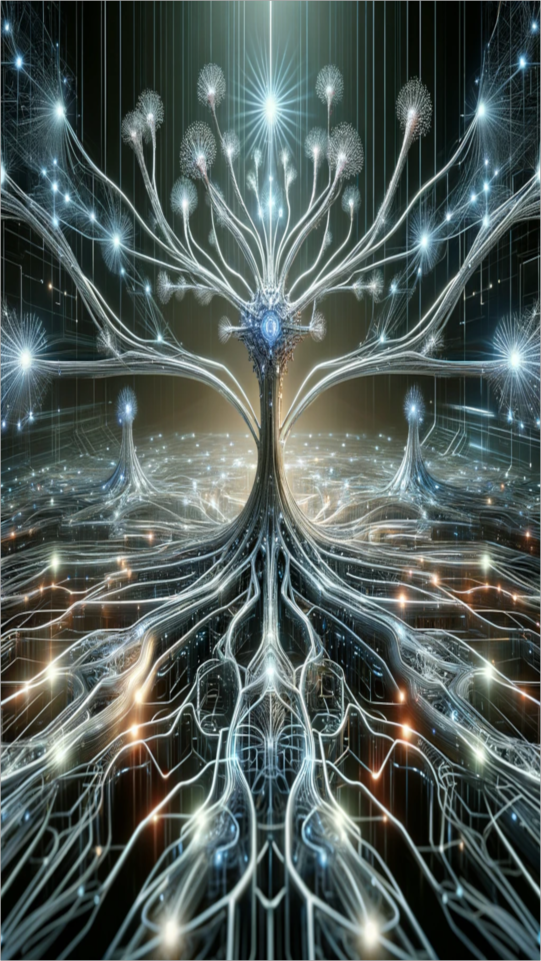

In [2]:
ing = load("tuesday-nocompression.png")

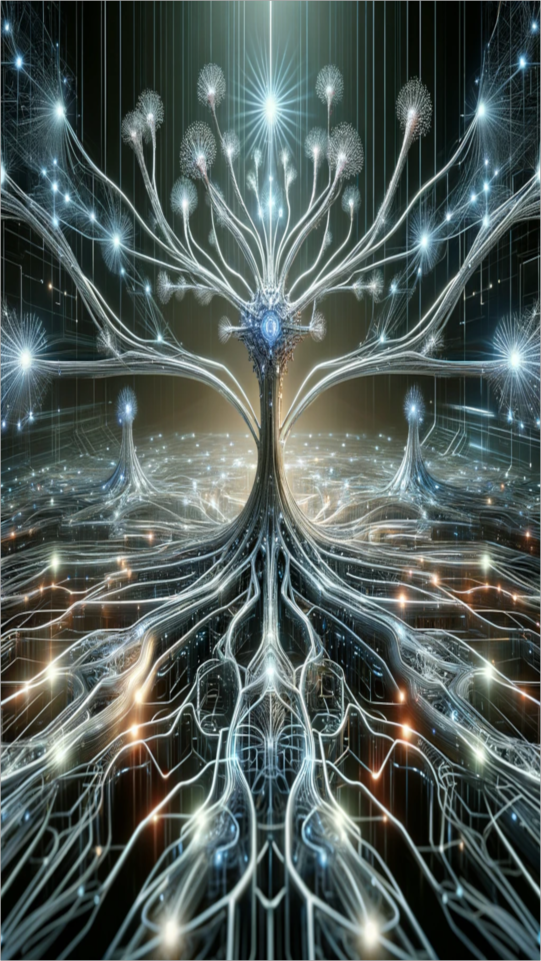

In [3]:
im = 1*ing

In [4]:
(xsize, ysize) = size(im)

(1920, 1080)

In [78]:
function warp(x, y, p)
    xcenter = p[:xcenter]
    ycenter = p[:ycenter]
    distance = sqrt((xcenter-x)^2 + (ycenter-y)^2)
    mod_ = 0.005*sin(p[:distance_coef]*distance + p[:shift]*2*pi/100)+0.99
    g(xcenter, x) = xcenter + (x - xcenter)*mod_
    xnew = g(xcenter, x)
    ynew = g(ycenter, y)
    xnew, ynew
end

warp (generic function with 1 method)

In [79]:
function apply_warp(warp, im, p)
    (xsize, ysize) = size(im)
    p[:xsize] = xsize
    p[:ysize] = ysize
    function linear_interpolation(x_y)
        # a rough draft, this can be improved; works on im
        x = x_y[1]
        y = x_y[2]
        dx=mod(x,1)
        dy=mod(y,1)
        x_left = floor(Int,x)
        y_left = floor(Int,y)
        x_right = min(x_left + 1, xsize)
        y_right = min(y_left + 1, ysize)
        im[x_left,y_left]*(1-dx)*(1-dy) + im[x_left,y_right]*(1-dx)*dy + im[x_right,y_left]*dx*(1-dy) + im[x_right, y_right]*dx*dy
    end
    [linear_interpolation(warp(x,y,p)) for x in 1:xsize, y in 1:ysize]
end

apply_warp (generic function with 1 method)

In [80]:
params = Dict(:distance_coef=>0.1, :xcenter=>1920, :ycenter=>540, :shift=>0) 
params

Dict{Symbol, Real} with 4 entries:
  :shift         => 0
  :distance_coef => 0.1
  :xcenter       => 1920
  :ycenter       => 540

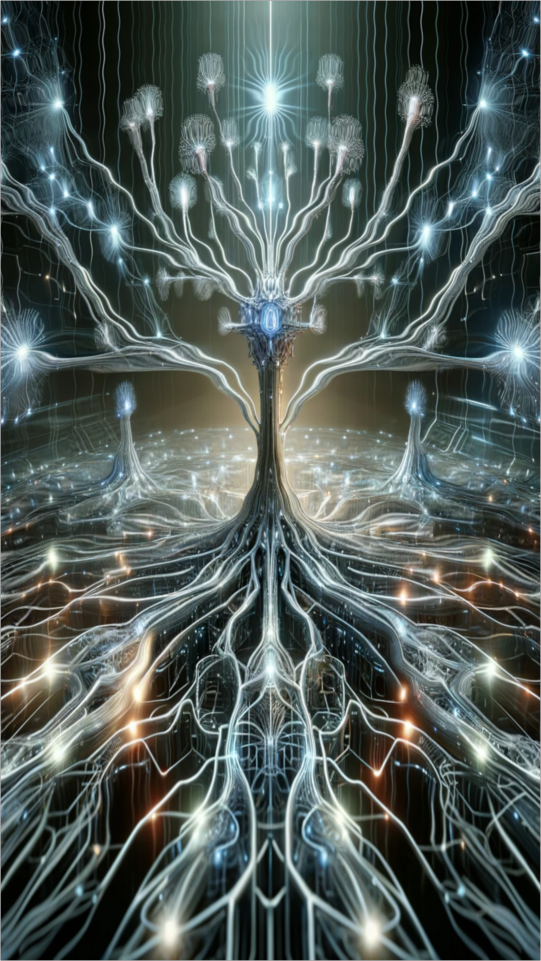

In [81]:
apply_warp(warp, im, params)

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,

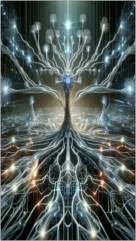
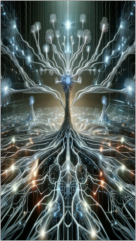
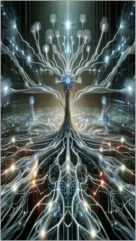
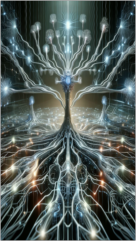
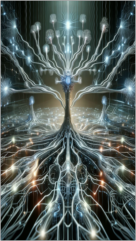
...
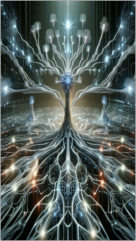
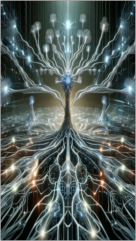
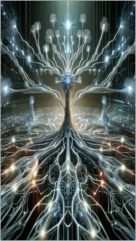
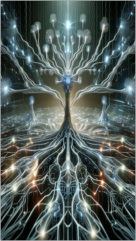
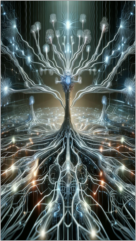

In [82]:
imgs = [apply_warp(warp, im, params) for params[:shift] in 0:99]

In [83]:
size(imgs)

(100,)

In [84]:
save("wednesday-2.gif", cat(imgs..., dims=3), fps=24)

In [85]:
for i in 1:100
    save("t-3/wed-"*string(i)*".png", imgs[i])    
end